<a href="https://colab.research.google.com/github/Sittipark/Spider_Classification_AIB/blob/main/SpiderClassification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **ติดตั้ง**

In [ ]:
!pip install -Uqq fastbook

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.8/719.8 kB 10.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 542.0/542.0 kB 15.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 13.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 12.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 13.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 401.2/401.2 kB 17.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 24.9 MB/s eta 0:00:00


# **Import Libralies**

In [ ]:
from fastai import *
import fastbook
from fastbook import *

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

In [ ]:
fastbook.setup_book()
from google.colab import drive

Mounted at /content/gdrive


In [ ]:
drive.mount('/content/drive', force_remount = True) #เรียกใช้ไฟล์จาก Google Drive

Mounted at /content/drive


In [ ]:
PathTrain = "/content/drive/MyDrive/SPIDER_DATASET/train/" #ตำเเหน่งของรูปที่นำมาใช้ Train

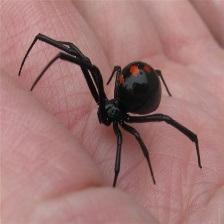

In [ ]:
from PIL import Image
Image.open("/content/drive/MyDrive/SPIDER_DATASET/train/black_widow/003.jpg")

# **สร้าง DataBlock เเละ Dataloader**

In [ ]:
fields = DataBlock(
    blocks = (ImageBlock, CategoryBlock),
    get_items = get_image_files,
    get_y = parent_label,
    splitter = RandomSplitter(valid_pct = 0.2, seed = 42), #valid 20% สำหรับตรวจสอบความเเม่นยำขณะ Train/ใส่ seed เพื่อแบ่ง data ให้เหมือนเดิมทุกครั้ง
    item_tfms = Resize(224),
    batch_tfms = aug_transforms(do_flip = True, flip_vert = True, max_rotate = 10
                                                    , min_zoom = 1, max_zoom = 1.1
                                                    , max_lighting = 0.75, max_warp = 0.2
                                                    , p_affine = 0.75, p_lighting = 0.75
                                                    , xtra_tfms = None, size = None
                                                    , mode = 'bilinear', pad_mode = PadMode.Reflection
                                                    , align_corners = True, batch = False, min_scale = 1) #ทำ Image Augmentation

)

# resnet --> resize ขนาดภาพเป็น 224

In [ ]:
dls = fields.dataloaders(PathTrain) #สร้าง dataloader

In [ ]:
dls.vocab #ตรวจเช็ค label

['black_widow', 'blue_tarantula', 'bold_jumper', 'brown_grass_spider', 'brown_recluse_spider', 'deinopis_spider', 'golden_orb_weaver', 'hobo_spider', 'huntsman_spider', 'ladybird_mimic_spider', 'peacock_spider', 'red_knee_tarantula', 'spiny_backed_orb_weaver', 'white_knee_tarantula', 'yellow_garden_spider']

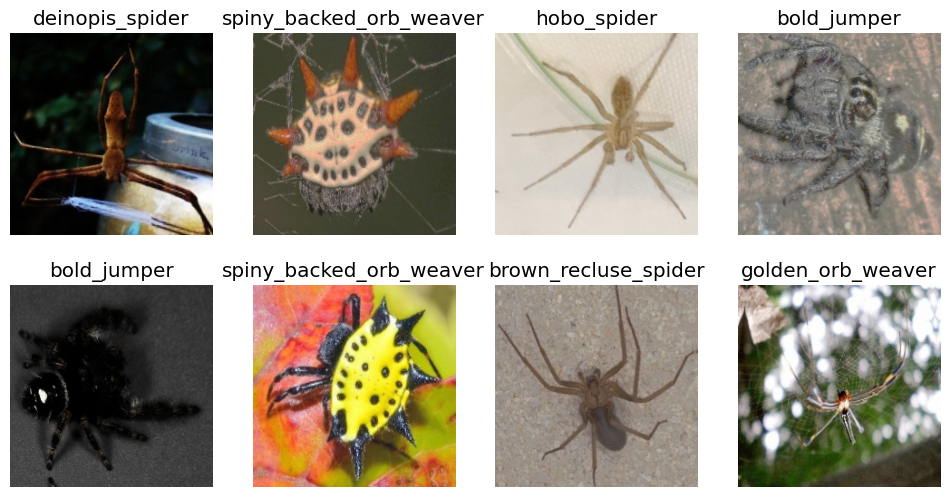

In [ ]:
dls.train.show_batch(max_n = 8, nrows = 2) #เเสดงตัวอย่างรูปใน Dataloader

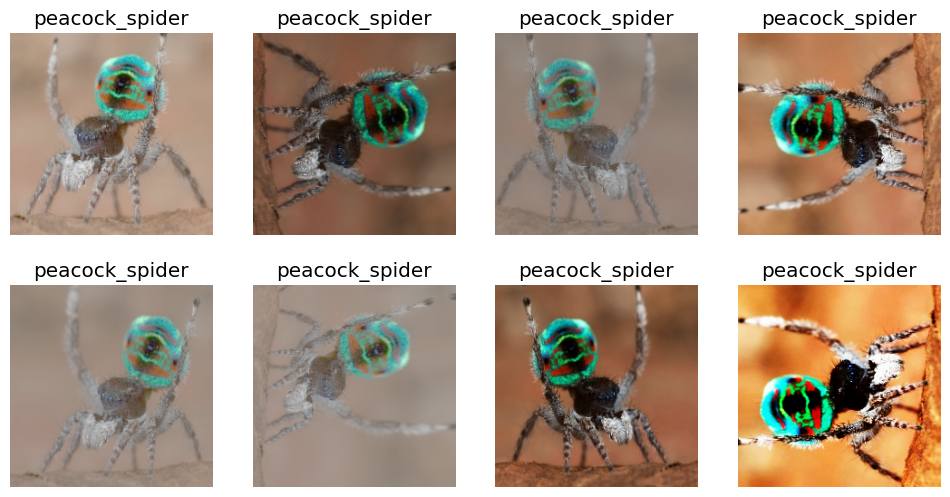

In [ ]:
dls.train.show_batch(max_n = 8, nrows = 2, unique = True) #เเสดงรูปเดียวกันที่ถูก augmentation

In [ ]:
# TEST
PathTest = "/content/drive/MyDrive/SPIDER_DATASET/" #ตำเเหน่งของข้อมูล testset

In [ ]:
#สร้าง Datablock สำหรับ testset
test_dblock = DataBlock(
    blocks = (ImageBlock, CategoryBlock),
    get_items = get_image_files,
    splitter = GrandparentSplitter(valid_name = 'test'),
    get_y = parent_label,
    item_tfms = Resize(244)
    )

In [ ]:
#สร้าง dataloader ของ testset
test_dls = test_dblock.dataloaders(PathTest, bs = 25)

# **ResNet34**

In [ ]:
learner = cnn_learner(dls, resnet34, metrics = [error_rate, accuracy])

/usr/local/lib/python3.10/dist-packages/fastai/vision/learner.py:301: UserWarning: `cnn_learner` has been renamed to `vision_learner` -- please update your code
  warn("`cnn_learner` has been renamed to `vision_learner` -- please update your code")
Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 105MB/s]


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


SuggestedLRs(valley=0.0006918309954926372)

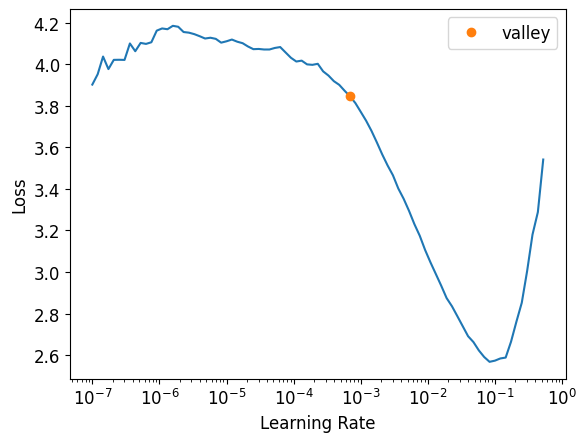

In [ ]:
#หา learning rate ที่เหมาะสม
learner.lr_find()

In [ ]:
learner.fine_tune(epochs = 20, freeze_epochs = 1, base_lr = 0.0006918309954926372)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,3.278183,1.239984,0.398034,0.601966,01:56


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,1.860735,1.020010,0.321867,0.678133,00:14
1,1.674318,0.838144,0.270270,0.729730,00:14
2,1.456819,0.712165,0.248157,0.751843,00:14
3,1.234142,0.614322,0.218673,0.781327,00:14
4,1.039803,0.524180,0.194103,0.805897,00:14
5,0.877232,0.480467,0.159705,0.840295,00:14
6,0.770996,0.469751,0.162162,0.837838,00:14
7,0.665432,0.441788,0.154791,0.845209,00:14
8,0.566410,0.443944,0.144963,0.855037,00:15
9,0.514941,0.463167,0.142506,0.857494,00:14


In [ ]:
interp = ClassificationInterpretation.from_learner(learner)
# interp.plot_confusion_matrix(figsize = (12, 12), dpi = 60)

In [ ]:
# interp.most_confused(min_val = 5)

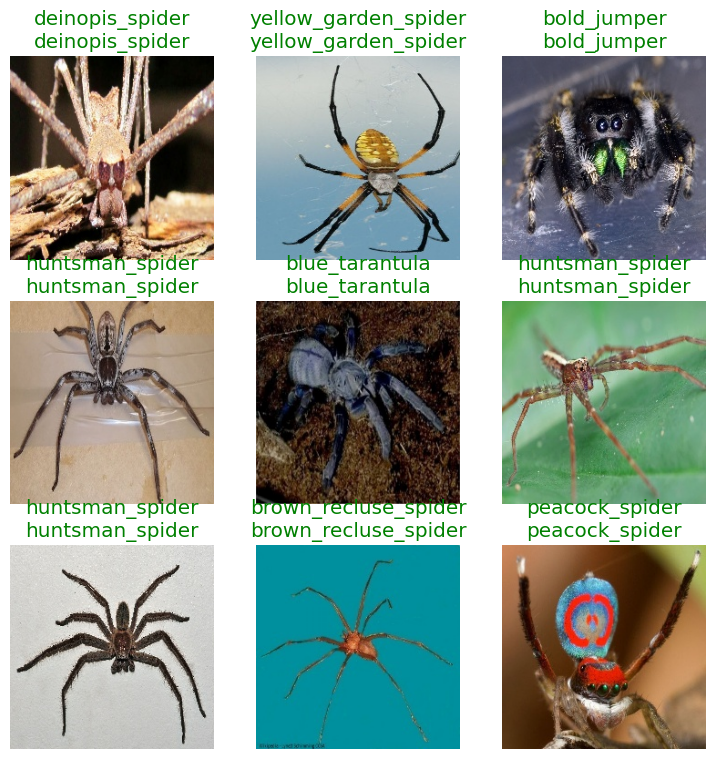

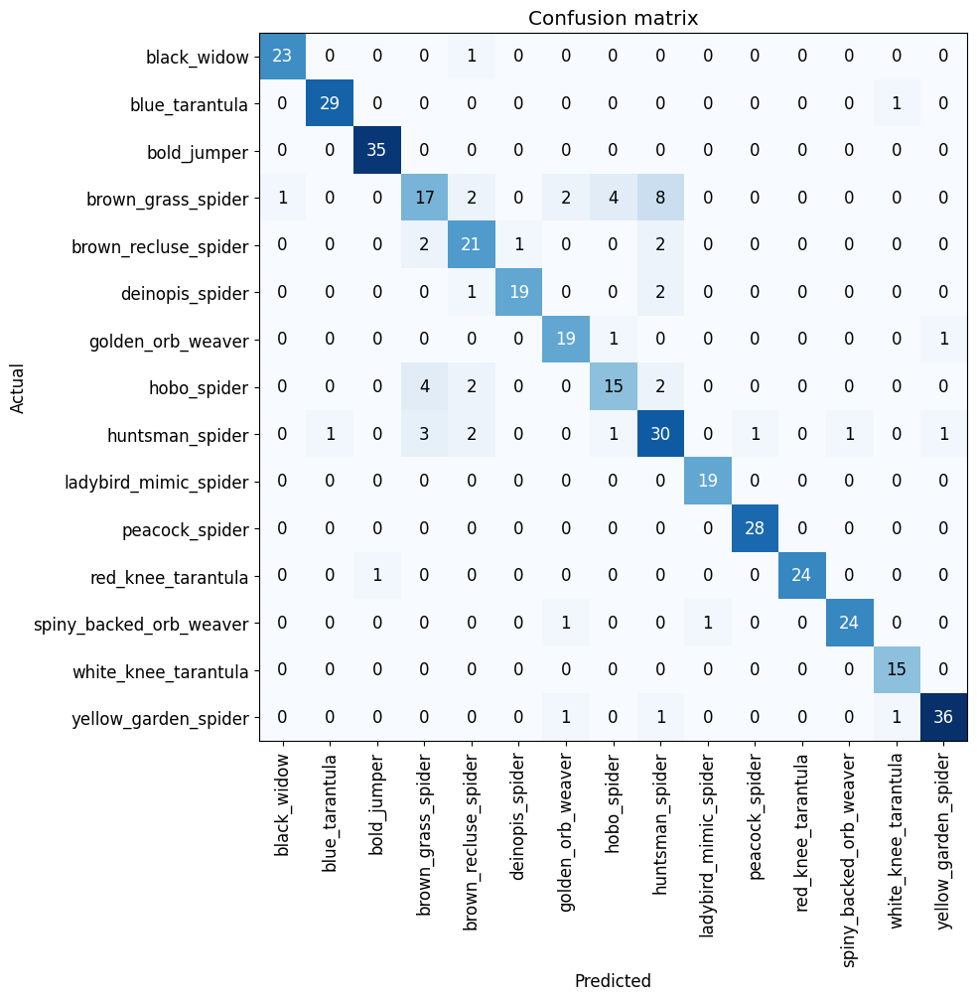

In [ ]:
#โชว์ข้อมูลหลังเทรน
learner.show_results(shuffle = True)
interp.plot_confusion_matrix(figsize = (10, 10))

In [ ]:
learner.export("resnet34_model_2.pkl") #เซฟโมเดล

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


                         precision    recall  f1-score   support

            black_widow       1.00      0.93      0.97        15
         blue_tarantula       1.00      0.93      0.97        15
            bold_jumper       1.00      1.00      1.00        15
     brown_grass_spider       0.67      0.93      0.78        15
   brown_recluse_spider       0.67      0.67      0.67        15
        deinopis_spider       1.00      0.93      0.97        15
      golden_orb_weaver       1.00      0.93      0.97        15
            hobo_spider       0.56      0.60      0.58        15
        huntsman_spider       0.83      0.67      0.74        15
  ladybird_mimic_spider       1.00      1.00      1.00        15
         peacock_spider       1.00      1.00      1.00        15
     red_knee_tarantula       0.83      1.00      0.91        15
spiny_backed_orb_weaver       1.00      1.00      1.00        15
   white_knee_tarantula       1.00      0.80      0.89        15
   yellow_garden_spider 

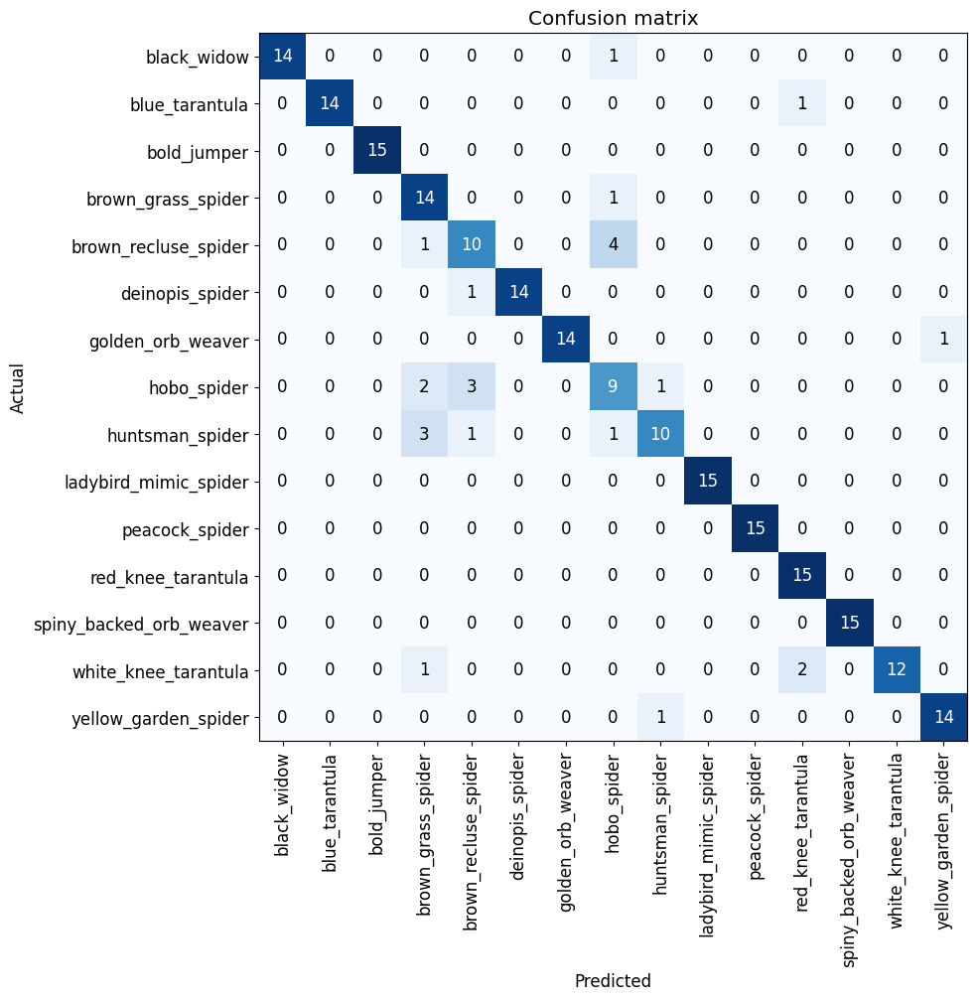

In [ ]:
#เรียกโมเดลที่ผ่านการเทรนมาทดสอบกับข้อมูล testset
learn_inf = load_learner('resnet34_model_2.pkl')
interp = ClassificationInterpretation.from_learner(learn_inf, dl = test_dls[1])
interp.plot_confusion_matrix(figsize = (10, 10))
interp.print_classification_report()

# **GoogLeNet**

In [ ]:
#สร้างโมเดลสำหรับเทรน
from torchvision.models import googlenet
learner_googlenet = vision_learner(dls, googlenet, metrics = [accuracy, error_rate], opt_func = Adam)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=GoogLeNet_Weights.IMAGENET1K_V1`. You can also use `weights=GoogLeNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/googlenet-1378be20.pth" to /root/.cache/torch/hub/checkpoints/googlenet-1378be20.pth
100%|██████████| 49.7M/49.7M [00:00<00:00, 72.1MB/s]


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


SuggestedLRs(valley=0.0010000000474974513)

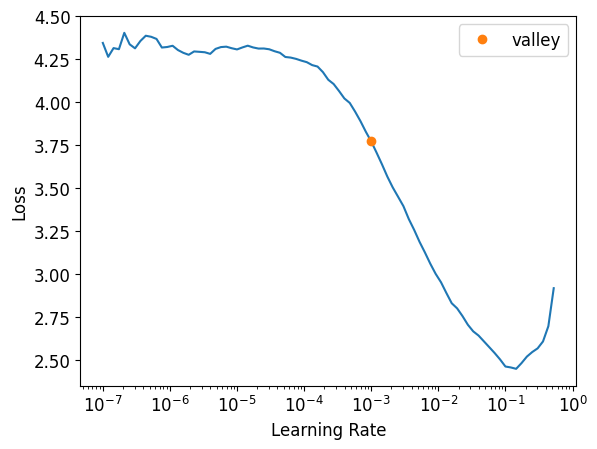

In [ ]:
learner_googlenet.lr_find() #หาค่า learning rate

In [ ]:
learner_googlenet.fine_tune(epochs = 20, freeze_epochs = 1, base_lr = 0.0010000000474974513)

epoch,train_loss,valid_loss,accuracy,error_rate,time
0,2.732597,0.843659,0.695332,0.304668,00:28


epoch,train_loss,valid_loss,accuracy,error_rate,time
0,1.154713,0.744838,0.742015,0.257985,00:17
1,1.085857,0.655558,0.771499,0.228501,00:14
2,1.023718,0.616959,0.778870,0.221130,00:13
3,0.933228,0.589093,0.813268,0.186732,00:13
4,0.884392,0.551523,0.815725,0.184275,00:13
5,0.802180,0.540373,0.825553,0.174447,00:14
6,0.753097,0.523800,0.828010,0.171990,00:14
7,0.690185,0.527891,0.830467,0.169533,00:13
8,0.639020,0.500204,0.845209,0.154791,00:13
9,0.596850,0.529631,0.830467,0.169533,00:14


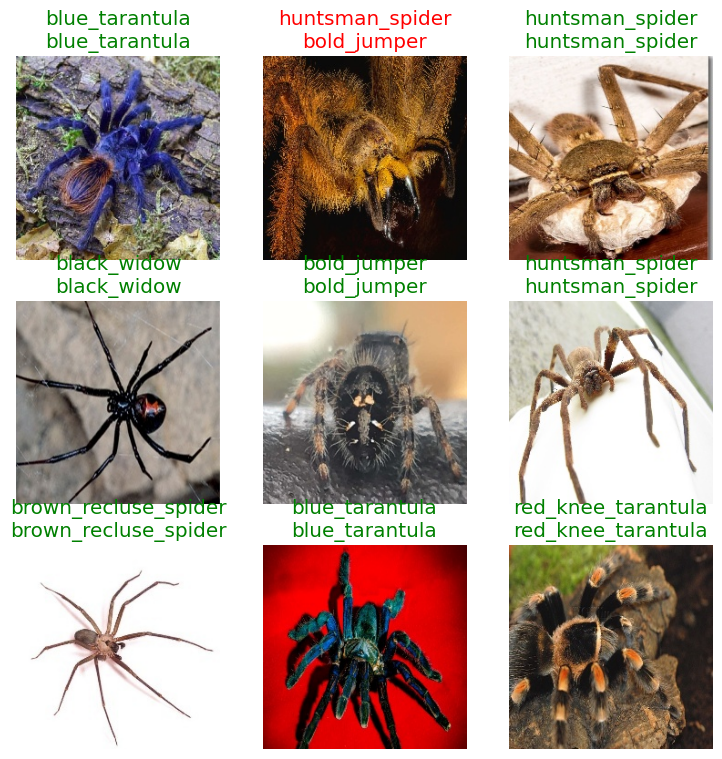

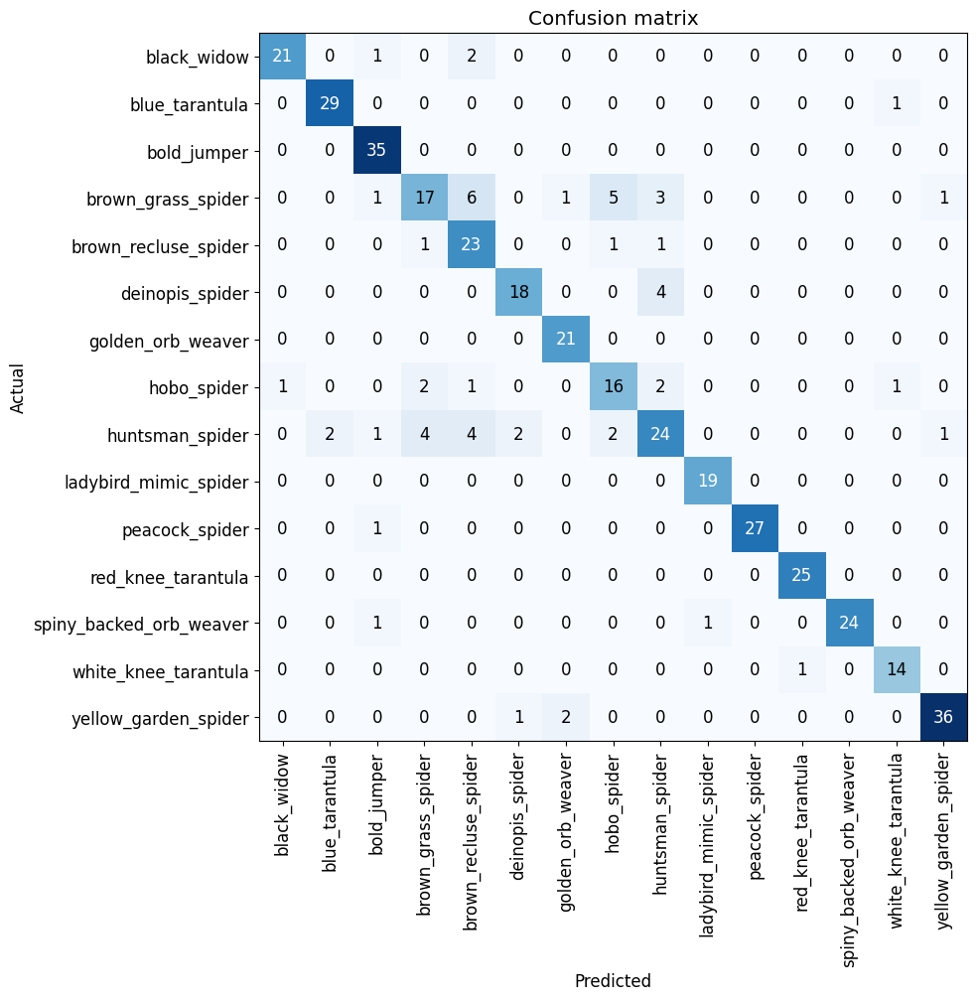

In [ ]:
#โชว์ข้อมูลหลังเทรน
learner_googlenet.show_results()
interp = ClassificationInterpretation.from_learner(learner_googlenet)
interp.plot_confusion_matrix(figsize = (10, 10))

In [ ]:
learner_googlenet.export("googlenet_model_2.pkl") #เซฟโมเดล

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


                         precision    recall  f1-score   support

            black_widow       1.00      0.93      0.97        15
         blue_tarantula       0.82      0.93      0.87        15
            bold_jumper       1.00      0.93      0.97        15
     brown_grass_spider       0.73      0.53      0.62        15
   brown_recluse_spider       0.58      0.73      0.65        15
        deinopis_spider       0.86      0.80      0.83        15
      golden_orb_weaver       1.00      0.93      0.97        15
            hobo_spider       0.54      0.47      0.50        15
        huntsman_spider       0.63      0.80      0.71        15
  ladybird_mimic_spider       1.00      1.00      1.00        15
         peacock_spider       1.00      1.00      1.00        15
     red_knee_tarantula       0.93      0.93      0.93        15
spiny_backed_orb_weaver       1.00      1.00      1.00        15
   white_knee_tarantula       0.88      0.93      0.90        15
   yellow_garden_spider 

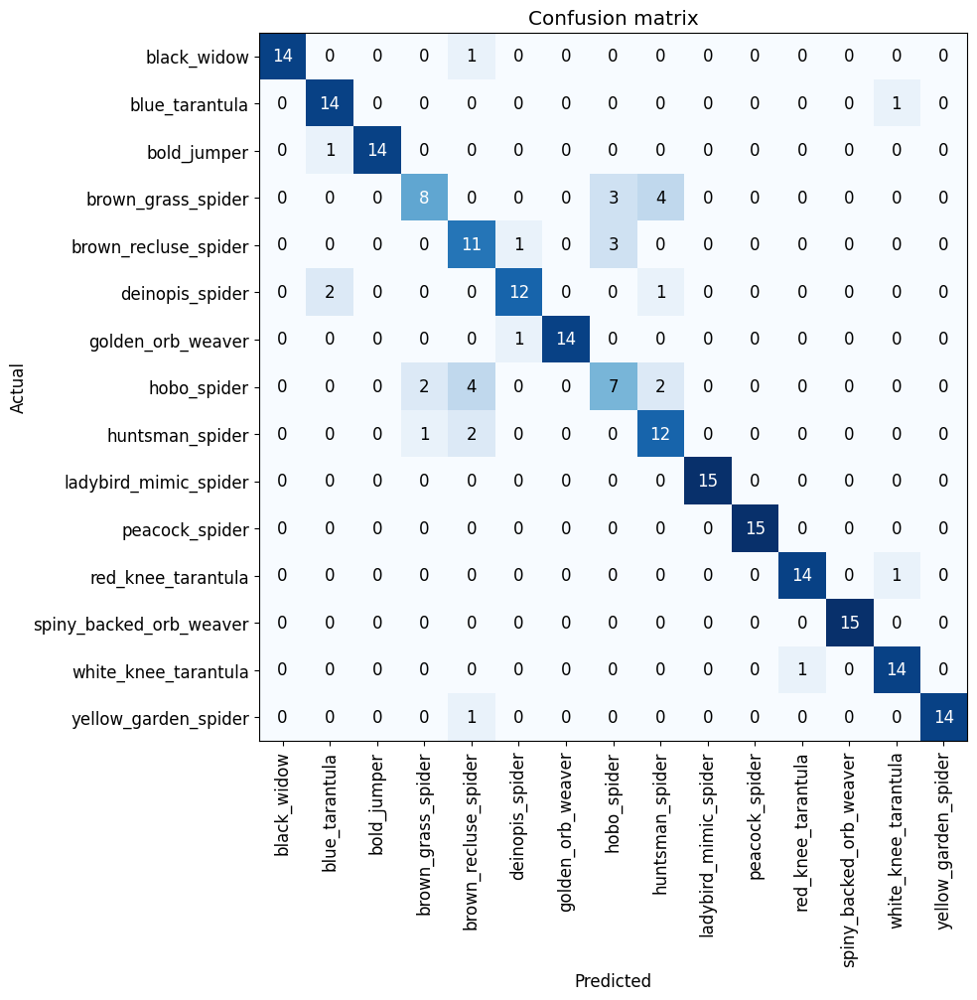

In [ ]:
#เรียกโมเดลที่ผ่านการ train มาทดสอบกับข้อมูล test set
learn_inf = load_learner('googlenet_model_2.pkl')
interp = ClassificationInterpretation.from_learner(learn_inf, dl = test_dls[1])
interp.plot_confusion_matrix(figsize = (10, 10))
interp.print_classification_report()

# **VGG19**

In [ ]:
#สร้างโมเดลสำหรับเทรน
learner_vgg19 = vision_learner(dls, vgg19_bn, metrics = [accuracy, error_rate], opt_func = Adam)

Downloading: "https://download.pytorch.org/models/vgg19_bn-c79401a0.pth" to /root/.cache/torch/hub/checkpoints/vgg19_bn-c79401a0.pth
100%|██████████| 548M/548M [00:16<00:00, 35.9MB/s]


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


SuggestedLRs(valley=0.0005754399462603033)

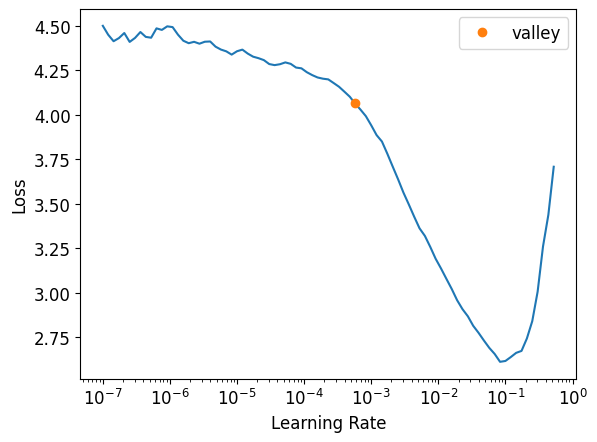

In [ ]:
learner_vgg19.lr_find() #หาค่า learning rate

In [ ]:
learner_vgg19.fine_tune(epochs = 20, freeze_epochs = 1, base_lr = 0.0005754399462603033)

epoch,train_loss,valid_loss,accuracy,error_rate,time
0,3.544230,1.536061,0.540541,0.459459,00:28


epoch,train_loss,valid_loss,accuracy,error_rate,time
0,2.113385,1.073545,0.648649,0.351351,00:36
1,1.892408,0.857166,0.702703,0.297297,00:35
2,1.660452,0.689667,0.746929,0.253071,00:37
3,1.413326,0.577221,0.776413,0.223587,00:35
4,1.205174,0.529319,0.805897,0.194103,00:35
5,1.025401,0.471442,0.828010,0.171990,00:35
6,0.888997,0.446081,0.830467,0.169533,00:35
7,0.755109,0.427604,0.840295,0.159705,00:37
8,0.650601,0.414460,0.837838,0.162162,00:35
9,0.571981,0.432634,0.842752,0.157248,00:35


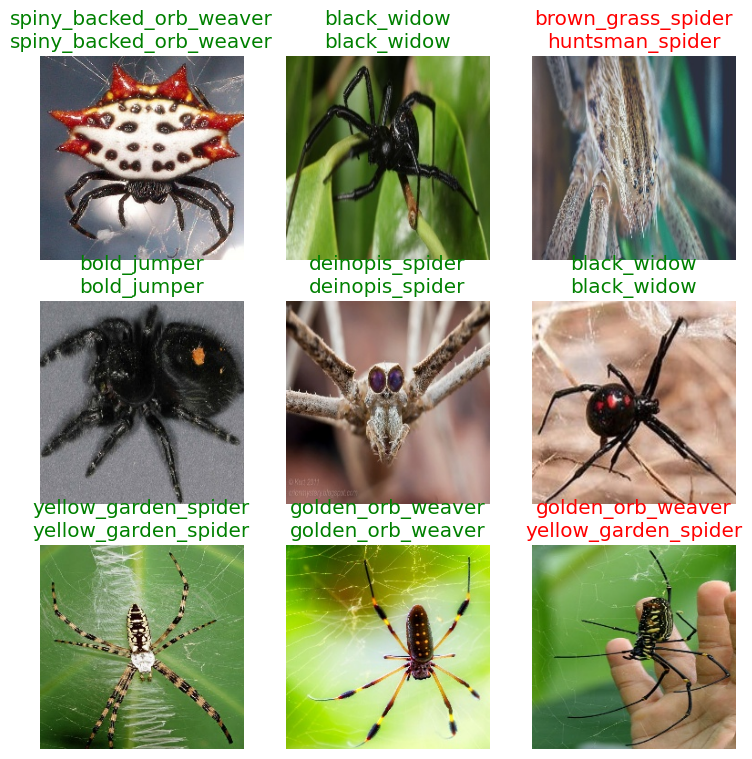

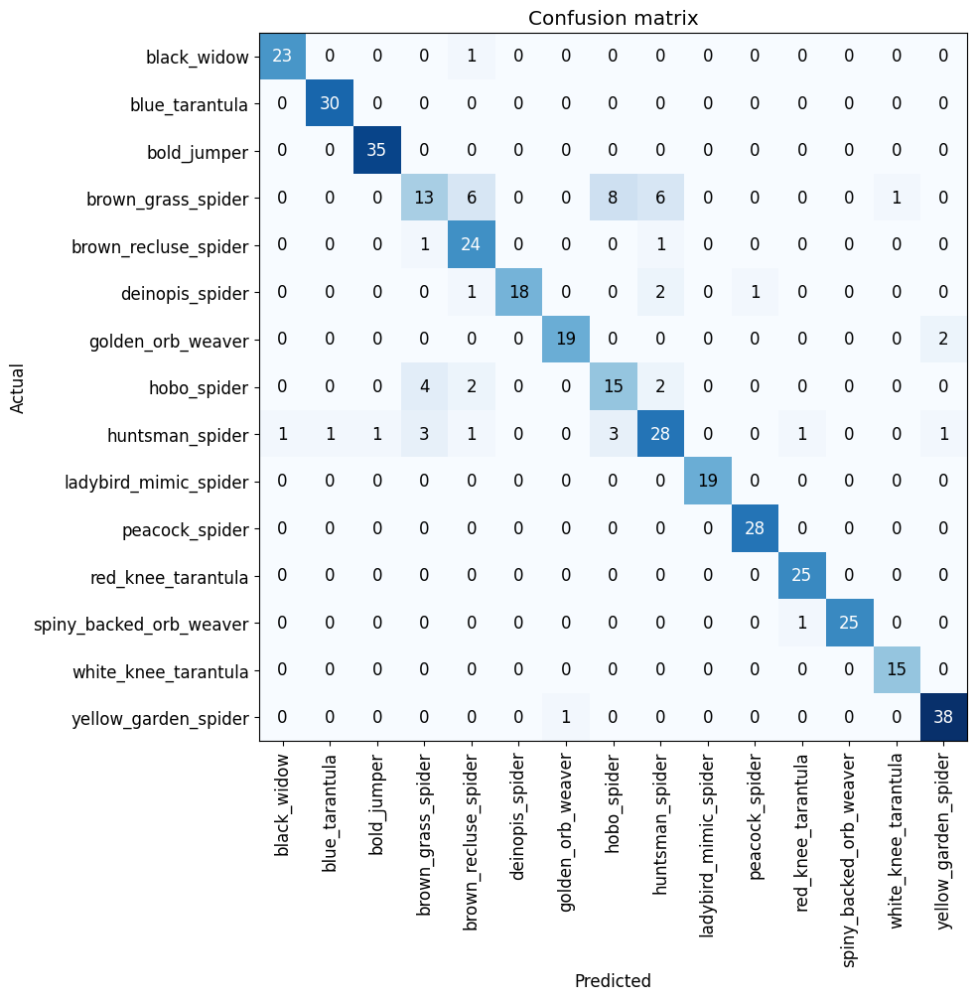

In [ ]:
#โชว์ข้อมูลหลังเทรน
learner_vgg19.show_results()
interp = ClassificationInterpretation.from_learner(learner_vgg19)
interp.plot_confusion_matrix(figsize = (10, 10))

In [ ]:
learner_vgg19.export("vgg19_model_2.pkl") #เซฟโมเดล

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


                         precision    recall  f1-score   support

            black_widow       1.00      0.93      0.97        15
         blue_tarantula       1.00      0.93      0.97        15
            bold_jumper       1.00      1.00      1.00        15
     brown_grass_spider       0.82      0.60      0.69        15
   brown_recluse_spider       0.72      0.87      0.79        15
        deinopis_spider       0.94      1.00      0.97        15
      golden_orb_weaver       1.00      0.87      0.93        15
            hobo_spider       0.58      0.73      0.65        15
        huntsman_spider       0.86      0.80      0.83        15
  ladybird_mimic_spider       1.00      1.00      1.00        15
         peacock_spider       1.00      0.93      0.97        15
     red_knee_tarantula       0.94      1.00      0.97        15
spiny_backed_orb_weaver       1.00      1.00      1.00        15
   white_knee_tarantula       0.94      1.00      0.97        15
   yellow_garden_spider 

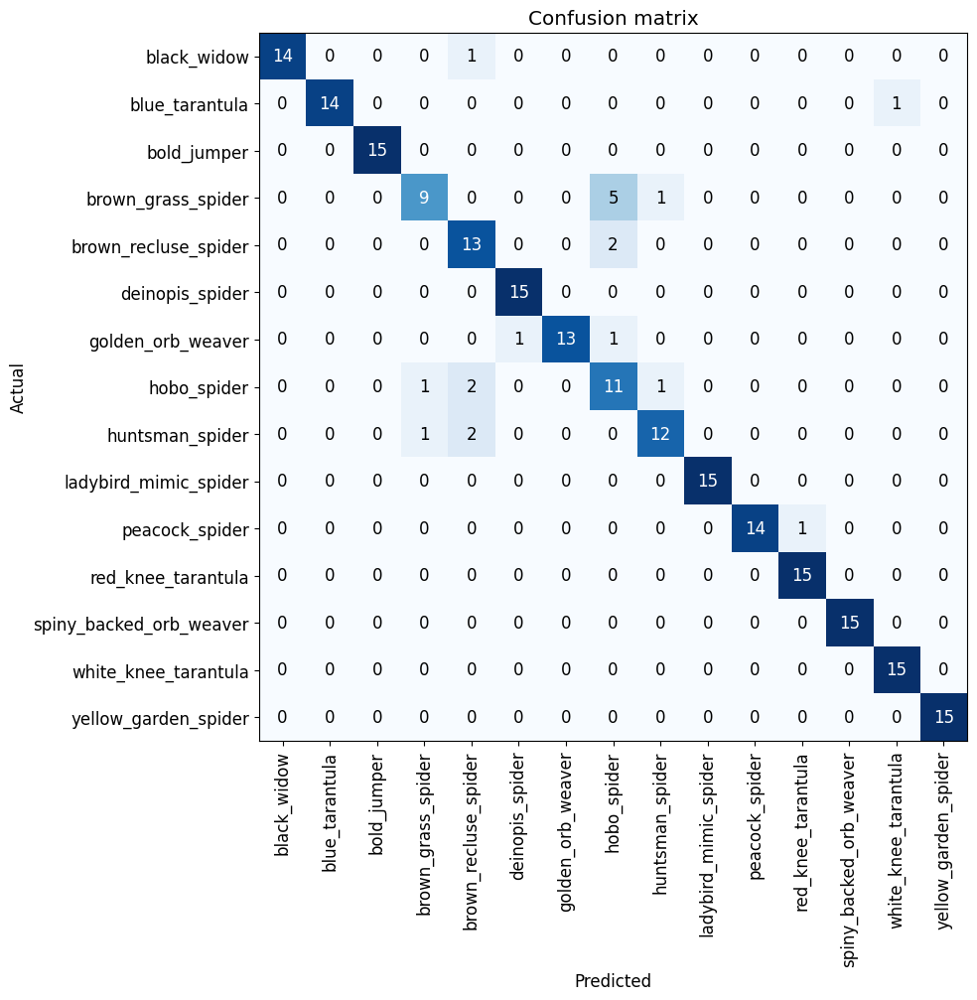

In [ ]:
#เรียกใช้โมเดลที่ผ่านการเทรนมาใช้กับ testset
learn_inf = load_learner('vgg19_model_2.pkl')
interp = ClassificationInterpretation.from_learner(learn_inf, dl = test_dls[1])
interp.plot_confusion_matrix(figsize = (10, 10))
interp.print_classification_report()

-------------------

# **The Best Model: VGG19**

In [ ]:
PathTest = "/content/drive/MyDrive/SPIDER_DATASET/" #ตำเเหน่งที่อยู่ของ mini valid

In [ ]:
#สร้าง datablock ของ mini valid
test_dblock = DataBlock(
    blocks = (ImageBlock, CategoryBlock),
    get_items = get_image_files,
    splitter = GrandparentSplitter(valid_name = 'valid'),
    get_y = parent_label,
    item_tfms = Resize(244)
    )

In [ ]:
#สร้าง dataloader ของ minivalit
test_dls = test_dblock.dataloaders(PathTest, bs = 25)

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


                         precision    recall  f1-score   support

            black_widow       1.00      1.00      1.00         5
         blue_tarantula       1.00      1.00      1.00         5
            bold_jumper       1.00      1.00      1.00         5
     brown_grass_spider       0.75      0.60      0.67         5
   brown_recluse_spider       1.00      1.00      1.00         5
        deinopis_spider       1.00      1.00      1.00         5
      golden_orb_weaver       1.00      1.00      1.00         5
            hobo_spider       0.44      0.80      0.57         5
        huntsman_spider       1.00      0.40      0.57         5
  ladybird_mimic_spider       1.00      1.00      1.00         5
         peacock_spider       1.00      1.00      1.00         5
     red_knee_tarantula       1.00      1.00      1.00         5
spiny_backed_orb_weaver       1.00      1.00      1.00         5
   white_knee_tarantula       1.00      1.00      1.00         5
   yellow_garden_spider 

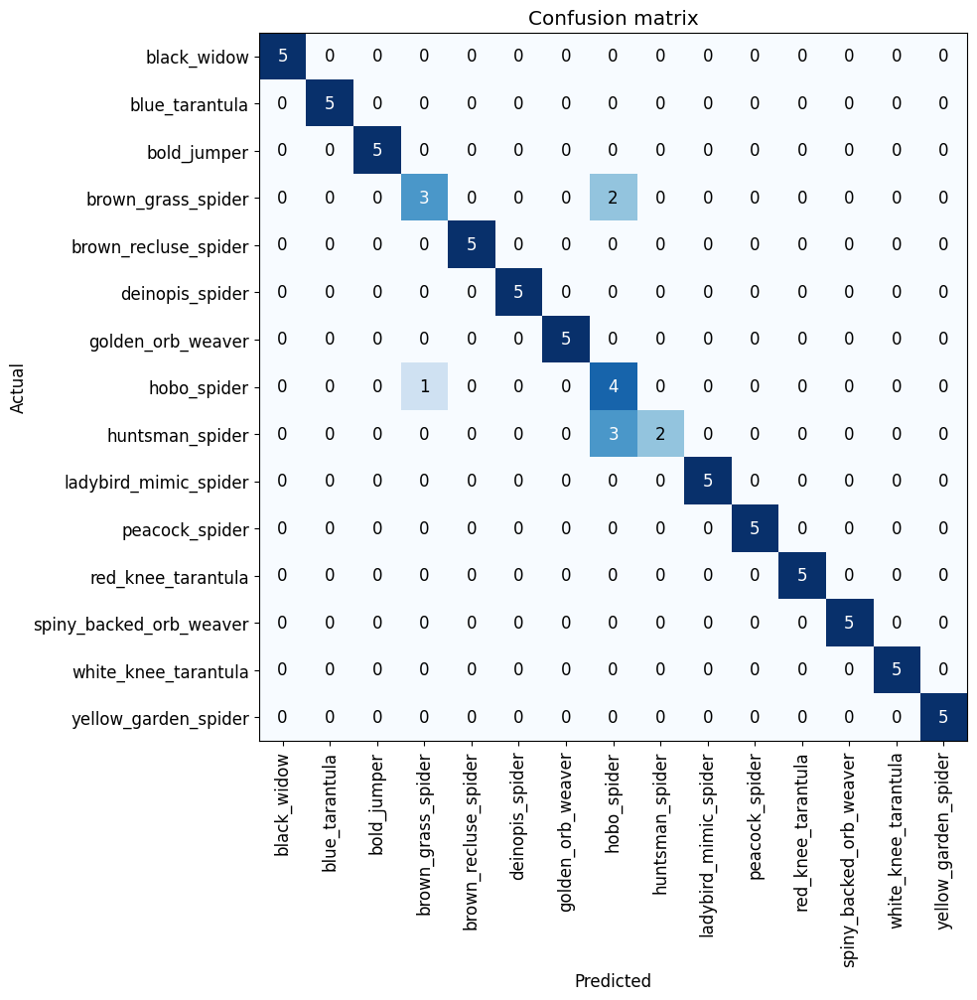

In [ ]:
#ใช้นำโมเดลที่ดีที่สุดจาก test set มาใช้ทดสอบกับ mini valid
learn_inf = load_learner('vgg19_model_2.pkl')
interp = ClassificationInterpretation.from_learner(learn_inf, dl = test_dls[1])
interp.plot_confusion_matrix(figsize = (10, 10))
interp.print_classification_report()

------------

# **ลองใช้โมเดล**

**(1)**

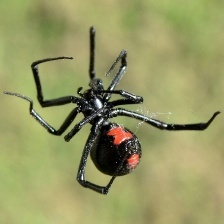

In [ ]:
Image.open("/content/drive/MyDrive/SPIDER_DATASET/test/black_widow/1.jpg")

In [ ]:
pred_class, class_num, prob = learn_inf.predict("/content/drive/MyDrive/SPIDER_DATASET/test/black_widow/1.jpg")

In [ ]:
# prob.numpy().sum()
prob.numpy()

array([9.9996102e-01, 2.1202122e-06, 3.4928401e-06, 2.2950610e-07, 6.1053647e-06, 4.0186515e-06, 7.9424726e-06, 5.3241092e-07, 1.7504402e-07, 1.1276321e-06, 5.3346889e-06, 2.3397847e-07,
       5.0356361e-06, 1.8385509e-07, 2.5367733e-06], dtype=float32)

In [ ]:
pred_class

'black_widow'

**(2)**

In [ ]:
from fastbook import *
from glob import glob
from pathlib import Path

learn_inf = load_learner('/content/drive/MyDrive/SPIDER_DATASET/model/vgg19_model_2.pkl')

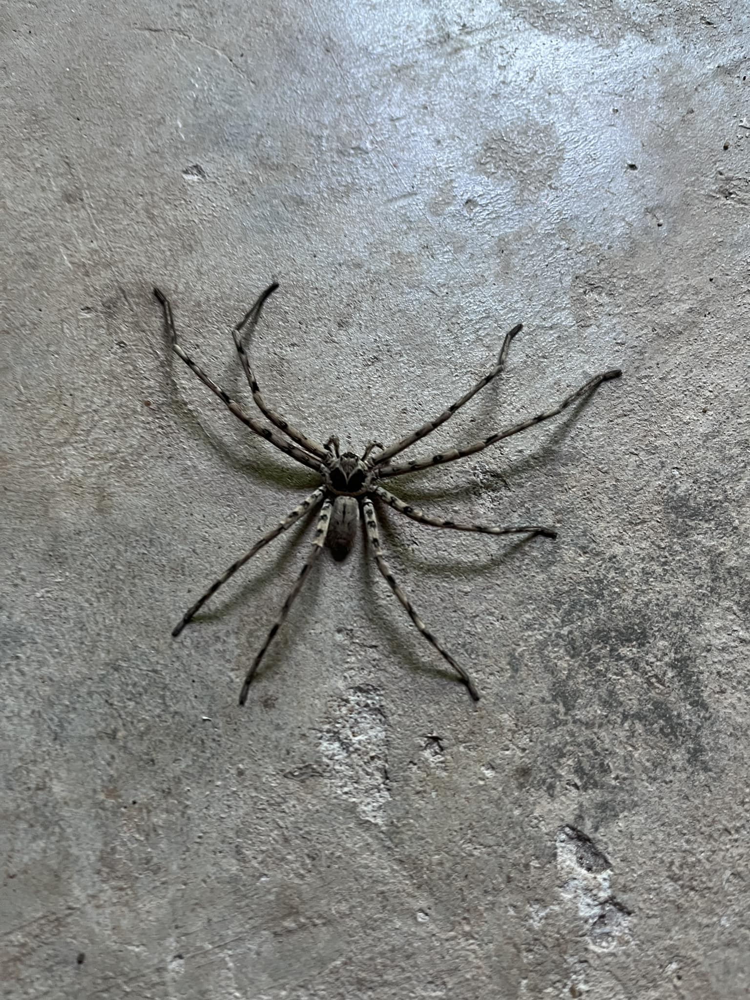

In [ ]:
Image.open("/content/drive/MyDrive/SPIDER_DATASET/what3.jpg")

In [ ]:
learn_inf.predict("/content/drive/MyDrive/SPIDER_DATASET/what3.jpg")

('huntsman_spider',
 tensor(8),
 tensor([6.1247e-02, 1.6841e-03, 1.0876e-03, 3.6699e-01, 1.5221e-01, 1.6508e-03, 8.7996e-04, 3.0731e-02, 3.8076e-01, 3.7174e-04, 8.2680e-04, 3.0731e-04, 2.3188e-04, 2.3855e-04, 7.8705e-04]))

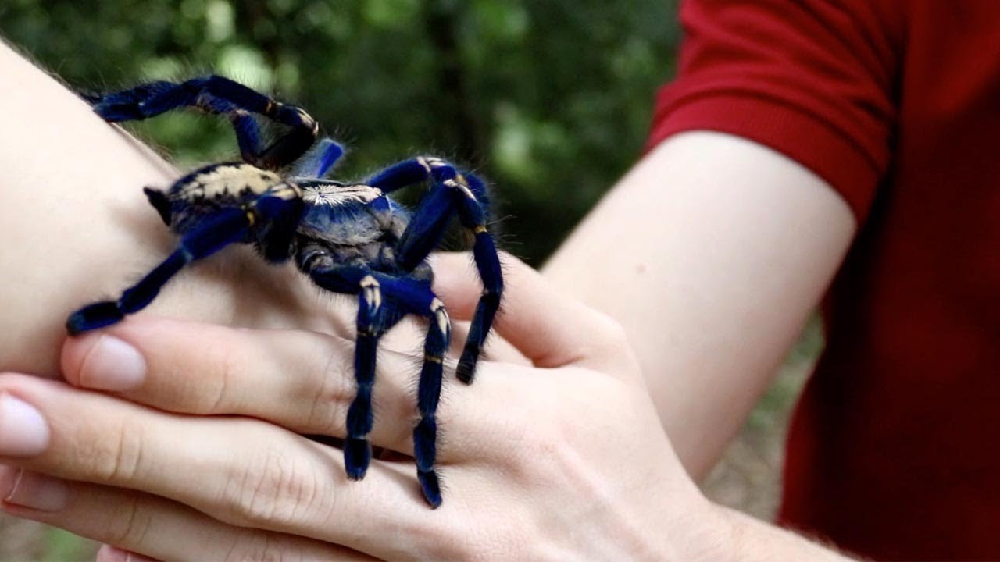

In [ ]:
Image.open("/content/drive/MyDrive/SPIDER_DATASET/blue1.jpg")

In [ ]:
learn_inf.predict("/content/drive/MyDrive/SPIDER_DATASET/blue1.jpg")

('blue_tarantula',
 tensor(1),
 tensor([2.1875e-06, 9.9995e-01, 1.2682e-06, 7.7358e-08, 1.6106e-07, 8.3090e-07, 1.1008e-06, 6.7578e-08, 4.6146e-06, 6.4221e-06, 2.4540e-05, 3.1925e-07, 2.7488e-06, 5.4845e-07, 2.4771e-06]))

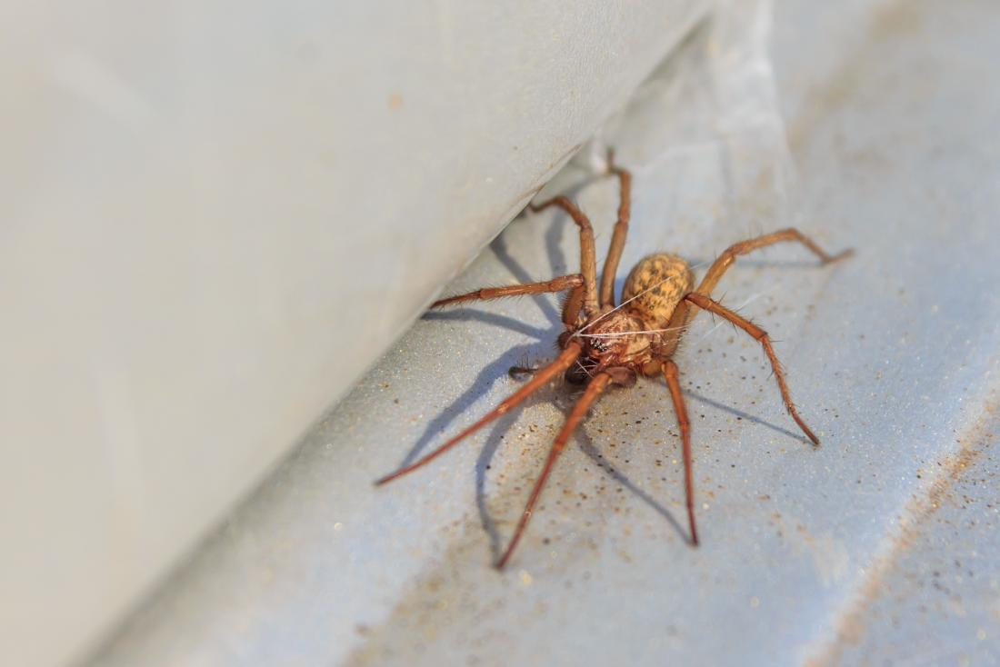

In [ ]:
Image.open("/content/drive/MyDrive/SPIDER_DATASET/what5.jpg")

In [ ]:
learn_inf.predict("/content/drive/MyDrive/SPIDER_DATASET/what5.jpg")

('hobo_spider',
 tensor(7),
 tensor([2.9640e-05, 6.8548e-05, 6.6549e-06, 2.4868e-02, 1.1859e-02, 1.8725e-04, 3.9332e-05, 9.5596e-01, 6.6670e-03, 1.2958e-04, 6.6353e-06, 2.0519e-05, 3.6761e-05, 8.2414e-06, 1.1415e-04]))

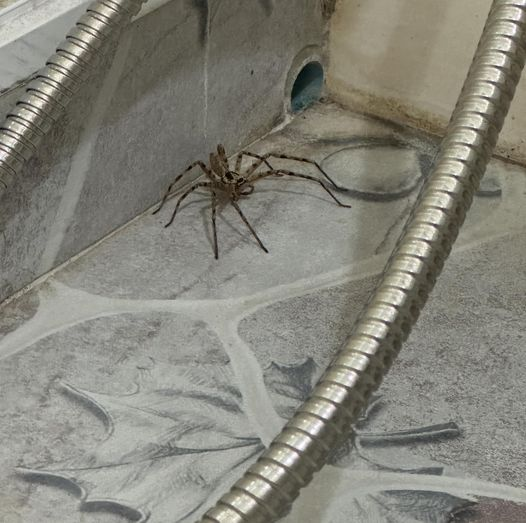

In [ ]:
Image.open("/content/drive/MyDrive/SPIDER_DATASET/what4.jpg")

In [ ]:
learn_inf.predict("/content/drive/MyDrive/SPIDER_DATASET/what4.jpg")

('huntsman_spider',
 tensor(8),
 tensor([3.9001e-03, 3.1093e-04, 6.2760e-04, 4.4274e-02, 1.6719e-01, 6.4722e-03, 5.9095e-04, 1.3076e-01, 6.4003e-01, 1.0356e-04, 8.7519e-06, 3.6069e-04, 1.4721e-04, 1.1788e-03, 4.0440e-03]))